In [2]:
import os, sys
my_path = os.getcwd()+"/.."
print(my_path)
sys.path.append(my_path)
os.chdir(my_path)


import numpy as np
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline


#import ConveyorBelt as cb
from Ensembler.src.potentials.OneD import harmonicOsc
from Ensembler.src.potentials.ND import envelopedPotential
from Ensembler.src.integrator import monteCarloIntegrator, metropolisMonteCarloIntegrator
from Ensembler.src.integrator import positionVerletIntegrator, leapFrogIntegrator
from Ensembler.src.system import system

from Ensembler.visualisation.plotSimulations import static_sim_plots
from Ensembler.visualisation.animationSimulation import animation_trajectory, animation_EDS_trajectory


C:\Users\benja\OneDrive - ETHZ\PhD\Code\Ensembler/..


# Plots of Simulations

## Stochastic Integrators

Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
STATES ARE BIIG
last_state:  State(position=7.760392111311225, temperature=298.0, totEnergy=30.111842860650743, totPotEnergy=30.111842860650743, totKinEnergy=nan, dhdpos=4.83, velocity=nan)
Trajectory length:  250


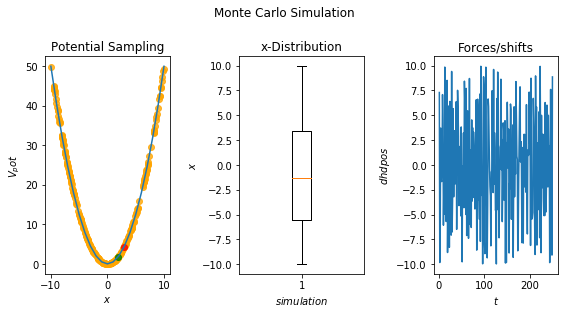

In [3]:
#Simple Monte Carlo simulation:
#settings
sim_steps = 250
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = monteCarloIntegrator(spaceRange=[x_min, x_max])#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True)
print("last_state: ", cur_state)
print("Trajectory length: ",len(sys.trajectory))

#plot
static_sim_plots(sys, title="Monte Carlo Simulation", x_range=list(range(-10,11)))

Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
last_state:  State(position=1.9700000000000046, temperature=298.0, totEnergy=1.9404500000000091, totPotEnergy=1.9404500000000091, totKinEnergy=nan, dhdpos=2.7, velocity=None)
250


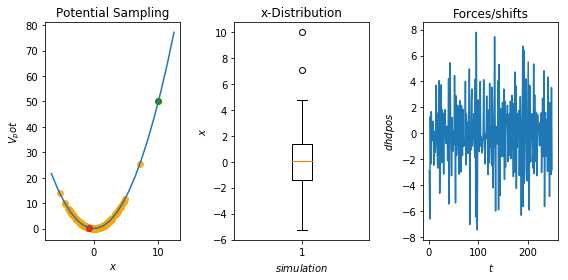

In [5]:
#Simple metropolis Monte Carlo simulation
#settings
sim_steps=250
#criterion= lambda ene_new, currentState: (ene_new < currentState.totPotEnergy)
x_min, x_max = (-10, 10)

pot=harmonicOsc()
integrator = metropolisMonteCarloIntegrator(spaceRange=[x_min, x_max])# metropolisCriterion=criterion (spaceRange=[min(x2), max(x2)], maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator,  position=10)

#simulate
cur_state = sys.simulate(steps=sim_steps, withdrawTraj=True)
print("last_state: ", cur_state)
print(len(sys.trajectory))

#plot
static_sim_plots(sys, )

## Newtonian Integrator

### Position Verlet

Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
init_state State(position=-8, temperature=298.0, totEnergy=32.0, totPotEnergy=32.0, totKinEnergy=nan, dhdpos=nan, velocity=-0.6764414556402681) 

last_state:  State(position=6.350797195104148, temperature=298.0, totEnergy=96.73187050744161, totPotEnergy=20.166312506671357, totKinEnergy=76.56555800077025, dhdpos=7.5882587743119245, velocity=-12.374615792077769) 

Trajectory length:  250


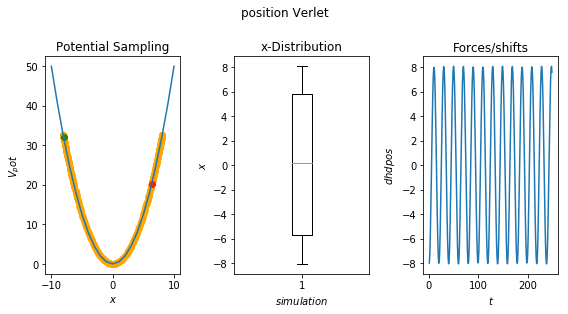

In [6]:
#Simple Position Verlet integration simulation:

#settings
sim_steps = 250
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = positionVerletIntegrator(dt=0.1)#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator, position=-8)

integrator.verbose= False
#simulate
sys.initVel()

cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)
print("init_state", sys.trajectory[0], "\n")
print("last_state: ",  sys.trajectory[-1], "\n")
print("Trajectory length: ",len(sys.trajectory))
#plot
static_sim_plots(sys, title="position Verlet", x_range=list(range(-10,11)))

### Leap Frog

In [3]:
#Leap Frog integration simulation:

#settings
sim_steps = 250
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = leapFrogIntegrator(dt=0.1)#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator, position=-8)

integrator.verbose= False
#simulate
sys._currentVelocities = 0
print(sys._currentVelocities)
cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)
print("init_state", sys.trajectory[0], "\n")
print("last_state: ",  sys.trajectory[-1], "\n")
print("Trajectory length: ",len(sys.trajectory))
#plot
static_sim_plots(sys, title="position Verlet", x_range=list(range(-10,11)))

Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
0


Exception: not implemented!

# Animations of Simulations

## Stochastic Integrators

## super  Monte Carlo Simulation:

Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
200
<Ensembler.src.system.system object at 0x00000110B5D142E8> [-10, 10]


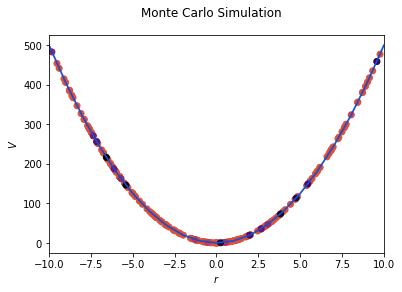

In [4]:
#settings
sim_steps = 200
space_range = [-10, 10]
pot=harmonicOsc(fc=10)
integrator = monteCarloIntegrator(spaceRange=space_range) #, maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator,  position=10)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True)
print(len(sys.trajectory))

#plot
print(sys, space_range)
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Monte Carlo Simulation")

import tempfile
os.chdir(tempfile.gettempdir())
from IPython.display import HTML
HTML(ani.to_jshtml())

Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
last_state:  State(position=2.9892165041060275, temperature=298.0, totEnergy=8.93541530841986, totPotEnergy=8.93541530841986, totKinEnergy=nan, dhdpos=0.6344299167060824, velocity=None)
200


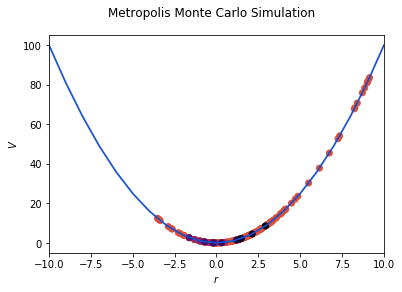

In [5]:
#super easy Metropolis_MonteCarlo simulation
#settings
space_range = [-10, 10]
sim_steps=200
pot=harmonicOsc(fc=2)
integrator = metropolisMonteCarloIntegrator(randomnessIncreaseFactor=5) 
sys=system(potential=pot, integrator=integrator,  position=9)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True) #500000, withdrawTraj=True)
print("last_state: ", cur_state)
print(len(sys.trajectory))


#plot
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Metropolis Monte Carlo Simulation")

##put it into jupyter:
import tempfile
os.chdir(tempfile.gettempdir())
from IPython.display import HTML
HTML(ani.to_jshtml())


Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
init_state State(position=-7.5, temperature=298.0, totEnergy=28.125, totPotEnergy=28.125, totKinEnergy=nan, dhdpos=nan, velocity=0) 

last_state:  State(position=-6.586070782738367, temperature=298.0, totEnergy=57.99526247463458, totPotEnergy=21.68816417761998, totKinEnergy=36.3070982970146, dhdpos=-7.43821042266852, velocity=8.521396399301537) 

Trajectory length:  200


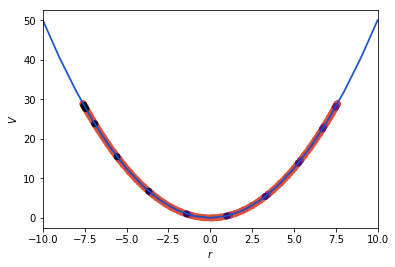

In [6]:
#Simple Verlet integration simulation:
#UNDER DEVELOPMENT!The temperature is not constant!!! -- BUGGY!
#settings
sim_steps = 200
x_min, x_max = (-10, 10)
max_step_size = 2.0
pot=harmonicOsc()
integrator = positionVerletIntegrator(dt=0.1)#maxStepSize=max_step_size,
sys=system(potential=pot, integrator=integrator, position=-7.5)
sys._currentVelocities = 0

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)
print("init_state", sys.trajectory[0], "\n")
print("last_state: ",  sys.trajectory[-1], "\n")
print("Trajectory length: ",len(sys.trajectory))

#animation
ani, out_path = animation_trajectory(sys, [x_min, x_max])

import tempfile
os.chdir(tempfile.gettempdir())
from IPython.display import HTML
HTML(ani.to_jshtml())

# EDS MMC sims

In [ ]:
#Metropolis Monte Carlo Simulation for EDS
##Construct potential
fc=2
Eoffs=(0, 0, 0, 1, -1)
positions = [x / float(10) for x in range(-300, 301)]
V_is=[harmonicOsc(x_shift=-20, fc=fc), harmonicOsc(x_shift=20, fc=fc),
      harmonicOsc(x_shift=10, fc=fc), harmonicOsc(x_shift=-10, fc=fc), harmonicOsc(x_shift=0, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = metropolisMonteCarloIntegrator(minStepSize=1) 
sys=system(potential=eds_pot, integrator=integrator,  position=[20], verbose=False)
del sys.trajectory[:]


#simulate
values = [1.0, 0.09, 0.07,  0.05, 0.04, 0.03, 0.02, 0.01]
svals = values+list(reversed(values))
sequence_repeats = 100
each_sim = 500
total_s_sim = svals*sequence_repeats
number_s = len(total_s_sim)

print("Progress: ", end="")
for ind,s in enumerate(total_s_sim):
    if(((ind/number_s)*100)%10 == 0): print(str((ind/number_s)*100)+"%", end="\t")
    sys.potential.s = s
    cur_state = sys.simulate(each_sim, withdrawTraj=False)
    
print()
print("last_state: ", cur_state)
print(len(sys.trajectory)) 


import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)

sys.potential._set_multiPos_mode()
sys.potential._set_type_check()

#animation
ani, out_path = animation_EDS_trajectory(sys, [min(positions),max(positions)], s_values=list(set(svals)), step_size=500)
print(tmp_dir)

from IPython.display import HTML
HTML(ani.to_jshtml())


Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
Progress: 0.0%	10.0%	20.0%	30.0%	40.0%	50.0%	60.0%	70.0%	80.0%	90.0%	
last_state:  State(position=array([[22],
       [22],
       [22],
       [22],
       [22]]), temperature=298.0, totEnergy=4.0, totPotEnergy=4.0, totKinEnergy=nan, dhdpos=1, velocity=None)
800000
C:\Users\benja\AppData\Local\Temp


Animation size has reached 20992722 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
Ensembler.src.potentials._baseclassesin _set_singlePos_mode  1
last_state:  State(position=array([[19.48293138],
       [19.48293138]]), temperature=298.0, totEnergy=599.3029103316542, totPotEnergy=599.3029103316542, totKinEnergy=nan, dhdpos=-0.5170686195196994, velocity=None)
4


ValueError: x and y must have same first dimension, but have shapes (200,) and (1,)

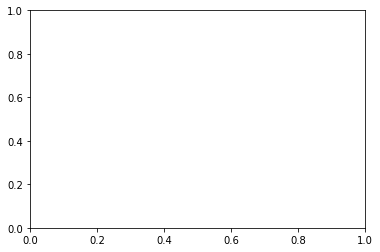

In [8]:
#Metropolis Monte Carlo Simulation for EDS
##Construct potential
fc=5
Eoffs=(0, 0)
V_is=[harmonicOsc(x_shift=4, fc=fc), harmonicOsc(x_shift=-4, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = metropolisMonteCarloIntegrator() 
sys=system(potential=eds_pot, integrator=integrator,  position=20)
del sys.trajectory[:]


#simulate
values = [1.0,  0.01]
svals = values+list(reversed(values))
each_sim = 1
for s in svals*1:
    sys.potential.s = s
    cur_state = sys.simulate(each_sim, withdrawTraj=False)
print("last_state: ", cur_state)
print(len(sys.trajectory))



import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)


#animation
tmp_dir = "/home/bschroed"
out_path=tmp_dir+"/harmOsc.mp4"
out_path = None
#matplotlib.rcParams['animation.embed_limit'] = 20971520*3#if three is not enough storage

ani, out_path = animation_EDS_trajectory(sys, x_range=[-10,10], 
                                         s_values=list(set(svals)), step_size=10, 
                                         out_path=out_path,  tot_pot_resolution=200)
print(tmp_dir)

from IPython.display import HTML
HTML(ani.to_jshtml())



In [ ]:
#Metropolis Monte Carlo Simulation for EDS
##Construct potential
fc=5
Eoffs=(0, 0)
V_is=[harmonicOsc(x_shift=4, fc=fc), harmonicOsc(x_shift=-4, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = metropolisMonteCarloIntegrator() 
sys=system(potential=eds_pot, integrator=integrator) #,  position=20)
del sys.trajectory[:]


#simulate
values = [1.0,  0.05, 0.03, 0.0125, 0.01]
svals = values+list(reversed(values))
each_sim = 200
for s in svals*3:
    sys.potential.s = s
    cur_state = sys.simulate(each_sim, withdrawTraj=False)
print("last_state: ", cur_state)
print(len(sys.trajectory))



import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)


#animation
tmp_dir = "/home/bschroed"
out_path=tmp_dir+"/harmOsc.mp4"
out_path = None

ani, out_path = animation_EDS_trajectory(sys, x_range=[-10,10], 
                                         s_values=list(set(svals)), step_size=10, 
                                         out_path=out_path, out_writer="ffmpeg", dpi=600, tot_pot_resolution=1000)
print(tmp_dir)

from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
#Newton Simulation for EDS
##Construct potential
fc=20
Eoffs=(0, 0)
V_is=[harmonicOsc(x_shift=7, fc=fc), harmonicOsc(x_shift=-7, fc=fc)]
eds_pot = envelopedPotential(V_is=V_is, s=1.0, Eoff_i=Eoffs)

#Build System
integrator = positionVerletIntegrator(dt=1)#maxStepSize=max_step_size,
sys=system(potential=eds_pot, integrator=integrator) #,  position=20)
del sys.trajectory[:]


#simulate
values = [1.0, 0.001]
svals = values+list(reversed(values))
for s in svals*4:
    sys.potential.s = s
    cur_state = sys.simulate(200, withdrawTraj=False)
print("last_state: ", cur_state)
print(len(sys.trajectory))



import tempfile
tmp_dir = tempfile.gettempdir()
os.chdir(tmp_dir)


#animation
tmp_dir = "/home/bschroed"
out_path=tmp_dir+"/harmOsc.mp4"
out_path = None

ani, out_path = animation_EDS_trajectory(sys, x_range=[-10,10], s_values=list(set(svals)), step_size=1)

from IPython.display import HTML
HTML(ani.to_jshtml())

